<a href="https://colab.research.google.com/github/ulle9/DL-School/blob/master/DLS_Final_project_9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Detection on Detectron2 (fashion dataset)**
### Deep learning school (MIPT), part 1, Final Project, Detection (Scenario 2)

## Stage 1: Install modules & import libraries

In [1]:
# install components
!pip install -q  cython pyyaml==5.1
!pip install -q -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
!pip install -q detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

     |████████████████████████████████| 276kB 3.7MB/s 
     |████████████████████████████████| 6.2MB 862kB/s 


In [2]:
# import detectron2 and some common detectron2 utilities
import detectron2
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.logger import setup_logger
from detectron2.structures import BoxMode
from detectron2.data import DatasetCatalog, MetadataCatalog
setup_logger()

import torch, torchvision

# import some common libraries
import numpy as np
import cv2
import random
import os
import json
from pathlib import Path
from google.colab.patches import cv2_imshow

# Check out our cuda resources
!nvidia-smi

Fri Jul  3 11:25:37 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.36.06    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P8    28W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Stage 2: Detection on a toy random dataset

In [3]:
# download, decompress the data
!wget -q https://github.com/matterport/Mask_RCNN/releases/download/v2.1/balloon_dataset.zip
!unzip balloon_dataset.zip > /dev/null

In [4]:
# Construction of balloon dictionary and register it in COCO Database

def get_balloon_dicts(img_dir):
    json_file = os.path.join(img_dir, "via_region_data.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    for idx, v in enumerate(imgs_anns.values()):
        record = {}
        
        filename = os.path.join(img_dir, v["filename"])
        height, width = cv2.imread(filename).shape[:2]
        
        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width
      
        annos = v["regions"]
        objs = []
        for _, anno in annos.items():
            assert not anno["region_attributes"]
            anno = anno["shape_attributes"]
            px = anno["all_points_x"]
            py = anno["all_points_y"]
            # poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            # poly = [p for x in poly for p in x]

            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                # "segmentation": [poly],
                "category_id": 0,
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

from detectron2.data import DatasetCatalog, MetadataCatalog
for d in ["train", "val"]:
    DatasetCatalog.register("balloon_" + d, lambda d=d: get_balloon_dicts("balloon/" + d))
    MetadataCatalog.get("balloon_" + d).set(thing_classes=["balloon"])
balloon_metadata = MetadataCatalog.get("balloon_train")

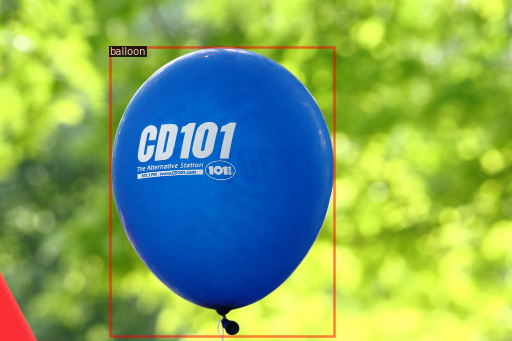

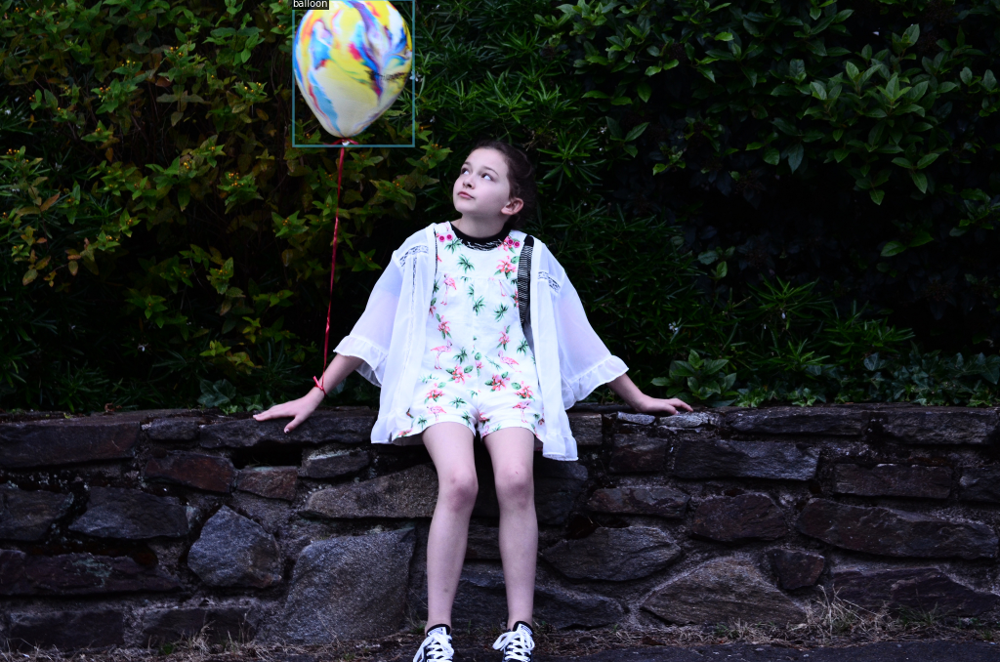

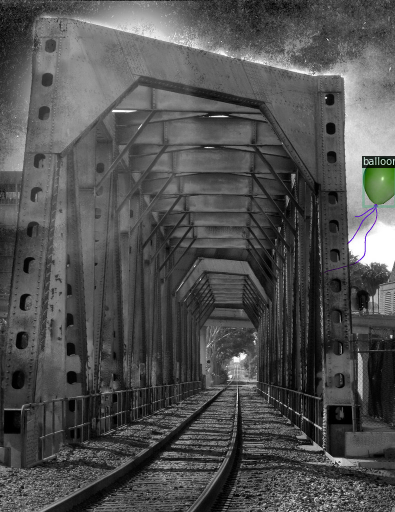

In [5]:
# Some visualization
dataset_dicts = get_balloon_dicts("balloon/train")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=balloon_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

In [6]:
#Training
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("balloon_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0002  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon)
cfg.MODEL.MASK_ON = False
cfg.OUTPUT_DIR = './output_b'

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[07/03 11:25:58 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:15, 10.8MB/s]                           
Unable to load 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model!
Unable to load 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model!
Unable to load 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model!
Unable to load 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model!


[07/03 11:26:23 d2.engine.train_loop]: Starting training from iteration 0
[07/03 11:26:47 d2.utils.events]:  eta: 0:05:36  iter: 19  total_loss: 1.452  loss_cls: 0.704  loss_box_reg: 0.626  loss_rpn_cls: 0.033  loss_rpn_loc: 0.009  time: 1.1861  data_time: 0.0288  lr: 0.000004  max_mem: 2520M
[07/03 11:27:12 d2.utils.events]:  eta: 0:05:19  iter: 39  total_loss: 1.341  loss_cls: 0.663  loss_box_reg: 0.614  loss_rpn_cls: 0.033  loss_rpn_loc: 0.006  time: 1.2075  data_time: 0.0077  lr: 0.000008  max_mem: 2641M
[07/03 11:27:35 d2.utils.events]:  eta: 0:04:49  iter: 59  total_loss: 1.209  loss_cls: 0.592  loss_box_reg: 0.506  loss_rpn_cls: 0.026  loss_rpn_loc: 0.004  time: 1.1934  data_time: 0.0073  lr: 0.000012  max_mem: 2641M
[07/03 11:27:58 d2.utils.events]:  eta: 0:04:22  iter: 79  total_loss: 1.245  loss_cls: 0.530  loss_box_reg: 0.583  loss_rpn_cls: 0.041  loss_rpn_loc: 0.009  time: 1.1887  data_time: 0.0065  lr: 0.000016  max_mem: 2641M
[07/03 11:28:23 d2.utils.events]:  eta: 0:03:5

In [7]:
# Configure model to predict
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("balloon_val", )
predictor = DefaultPredictor(cfg)

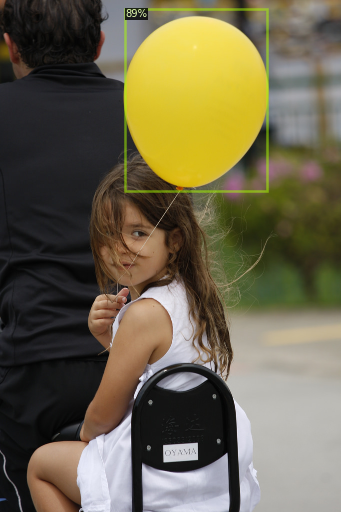

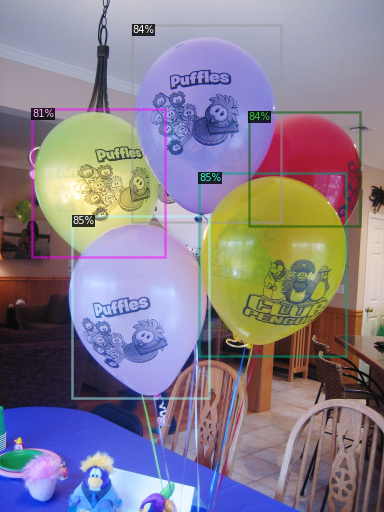

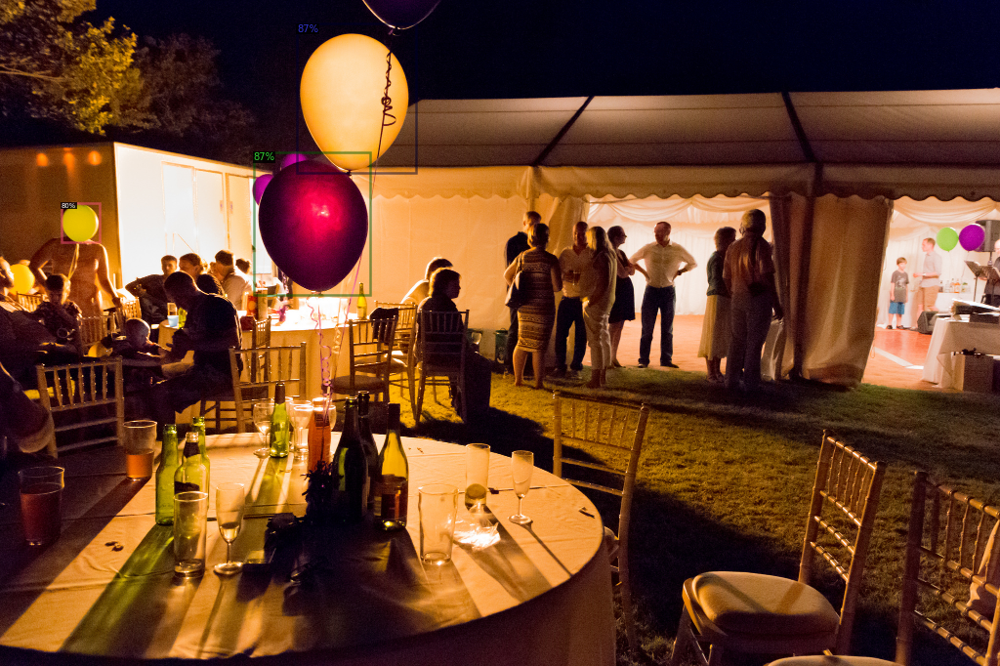

In [8]:
#Several results of predictions
dataset_dicts = get_balloon_dicts("balloon/val")
for d in random.sample(dataset_dicts, 3):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=balloon_metadata, 
                   scale=0.5)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

## Stage 3: Train on a fashion dataset

### Mount data drive

In [9]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


## Stage 4: Data preprocessing


#### Due to it is rather slow operation, to save our time I`ve run this function previosly and kept result in *.npy format.
You can see a function to make a proper dictionary below. No need to use it but you are welcome if you wish.

In [10]:
# def get_fashion_dicts(ann_dir):
#     dataset_dicts = []

#     for idx, json_file in enumerate(ann_dir.glob('*.*')):
#       with open(json_file) as f:
#           imgs_anns = json.load(f)

          
#           filename = os.path.join(img_dir, (str(json_file.stem)+'.jpg'))
#           height, width = cv2.imread(filename).shape[:2]

#           record = {}    
#           record["file_name"] = filename
#           record["image_id"] = idx
#           record["height"] = height
#           record["width"] = width

#           objs = []
#           for v in (imgs_anns.keys()) :
#             if 'item' in v:
#               obj = { "bbox": imgs_anns[v]['bounding_box'],
#                       "bbox_mode": BoxMode.XYXY_ABS,
#                       "category_id": imgs_anns[v]['category_id']}
#               if obj["category_id"] == 13:
#                 obj["category_id"] = 0
#               objs.append(obj)
         
#           record["annotations"] = objs
#           dataset_dicts.append(record)

#     return dataset_dicts

# img_dir = Path(r'drive/My Drive/Colab Notebooks/Fashion/train15')
# ann_dir = Path(r'drive/My Drive/Colab Notebooks/Fashion/train15_anno')
# train_dicts = get_fashion_dicts(ann_dir)     
# np.save('/content/drive/My Drive/Colab Notebooks/Fashion/train15_dict.npy', train_dicts) 

# img_dir = Path(r'drive/My Drive/Colab Notebooks/Fashion/val')
# ann_dir = Path(r'drive/My Drive/Colab Notebooks/Fashion/val_anno')
# val_dicts = get_fashion_dicts(ann_dir)     
# np.save('/content/drive/My Drive/Colab Notebooks/Fashion/val_dict.npy', val_dicts)

In [11]:
# a = list(np.load('/content/drive/My Drive/Colab Notebooks/Fashion/train_dict.npy', allow_pickle='TRUE'))
# b = list(np.load('/content/drive/My Drive/Colab Notebooks/Fashion/train14_dict.npy', allow_pickle='TRUE'))

# def numbers(lst):
#   for i in lst:
#     i['image_id'] += 130000
# numbers(b)

# e = a+b
# np.save('/content/drive/My Drive/Colab Notebooks/Fashion/train_dict.npy', e) 

#### Load fashion dictionaries

##### 1 class - clothes

In [12]:
# Function for easy loading
def read_dictionary2(x):
  if x == 'train2':
    tmp = list(np.load('/content/drive/My Drive/Colab Notebooks/Fashion/train_dict.npy', allow_pickle='TRUE'))
    for i in tmp:
      for y in range(len(i['annotations'])):
        i['annotations'][y]['category_id'] = 0
    return tmp
  elif x == 'val2':
    tmp = list(np.load('/content/drive/My Drive/Colab Notebooks/Fashion/val_dict.npy', allow_pickle='TRUE'))
    for i in tmp:
      for y in range(len(i['annotations'])):
        i['annotations'][y]['category_id'] = 0
    return tmp

# Class dictionary
f_classes = {0:'clothes'}

In [13]:
# Register dataset
if "fashion_train2" not in MetadataCatalog.list():
  for set in ["train2", "val2"]:
      DatasetCatalog.register("fashion_" + set, lambda set=set: read_dictionary2(set))
      MetadataCatalog.get("fashion_" + set).set(thing_classes=f_classes)
fashion_metadata2 = MetadataCatalog.get("fashion_train2")

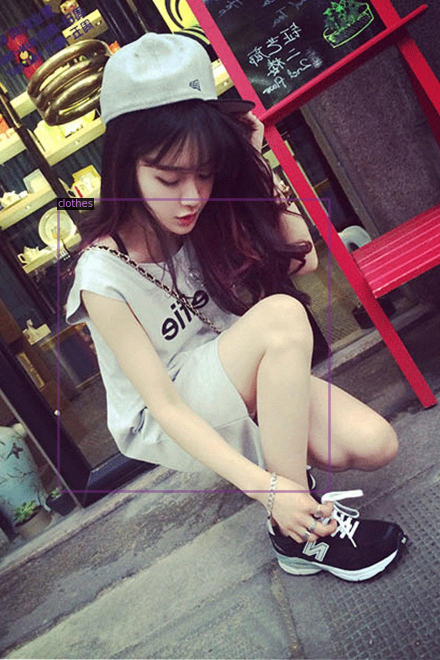

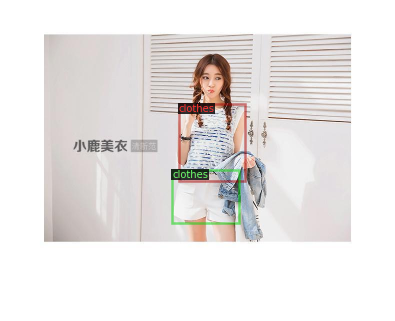

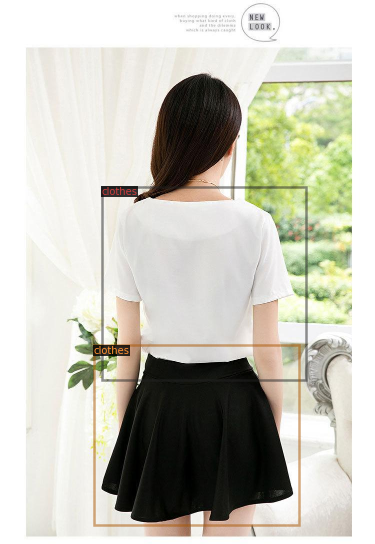

In [15]:
# Let`s see some pictures from our dataset
for d in random.sample(read_dictionary2('train2'), 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], 
                            metadata=fashion_metadata2, 
                            scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

##### Full set (13 classes)

In [16]:
# Function for easy loading
def read_dictionary(x):
  if x == 'train':
    return list(np.load('/content/drive/My Drive/Colab Notebooks/Fashion/train_dict.npy', allow_pickle='TRUE'))
  elif x == 'val':
    return list(np.load('/content/drive/My Drive/Colab Notebooks/Fashion/val_dict.npy', allow_pickle='TRUE'))

# Class dictionary
f_classes = {0:'sling dress', 1:'short sleeve top', 2: 'long sleeve top', 3: 'short sleeve outwear', 4:'long sleeve outwear', 5:'vest', 6: 'sling', 
           7: 'shorts', 8: 'trousers', 9: 'skirt', 10: 'short sleeve dress', 11: 'long sleeve dress', 12: 'vest dress'}

In [17]:
# Register dataset
if "fashion_train" not in MetadataCatalog.list():
  for set in ["train", "val"]:
      DatasetCatalog.register("fashion_" + set, lambda set=set: read_dictionary(set))
      MetadataCatalog.get("fashion_" + set).set(thing_classes=f_classes)
fashion_metadata = MetadataCatalog.get("fashion_train")

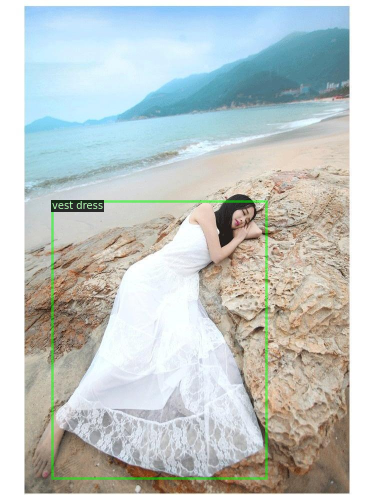

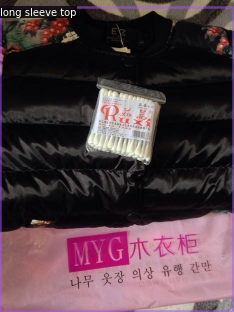

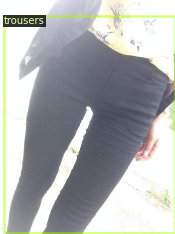

In [18]:
# Let`s see some pictures from our dataset
for d in random.sample(read_dictionary('train'), 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], 
                            metadata=fashion_metadata, 
                            scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

In [19]:
# Limit function to deal with several big unbalanced classes
def limit_dict(main_dict):
  count_dict = {}
  train_lim = []
  for i in range(13):
    count_dict.setdefault(str(i),0)
  for i in main_dict:
    x = True
    for j in i['annotations']:
      count_dict[str(j['category_id'])] += 1
      if count_dict[str(j['category_id'])] > 10000:
        x = False
    if x: train_lim.append(i)
  return train_lim

In [20]:
# Register limited dataset
if "fashion_train_lim" not in MetadataCatalog.list():
  for set in ["train", "val"]:
      DatasetCatalog.register("fashion_" + set + '_lim', lambda set=set: limit_dict(read_dictionary(set)))
      MetadataCatalog.get("fashion_" + set + '_lim').set(thing_classes=f_classes)
fashion_metadata = MetadataCatalog.get("fashion_train_lim")

## Stage 5.1: Training (1 class detection)

In [21]:
cfg2 = get_cfg()
cfg2.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg2.DATASETS.TRAIN = ("fashion_train2",)
cfg2.DATASETS.TEST = ()
cfg2.DATALOADER.NUM_WORKERS = 4
cfg2.SOLVER.IMS_PER_BATCH = 8
cfg2.SOLVER.BASE_LR = 0.001
cfg2.SOLVER.STEPS = (100, 150, 200, 250 )
cfg2.SOLVER.WARMUP_ITERS = 50  
cfg2.SOLVER.MAX_ITER = 300
cfg2.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64  # (default: 512)
cfg2.MODEL.ROI_HEADS.NUM_CLASSES = 1 # in that case we have just 1 class - clothes
cfg2.OUTPUT_DIR = './output2' # Change to your directory or comment to default (./output)
cfg2.MODEL.MASK_ON = False

# Uncomment line below if you want to load standart COCO-Detection weights
cfg2.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml") 

# Uncomment line below if you want to load pretrained weights
# cfg2.MODEL.WEIGHTS = '/content/drive/My Drive/Colab Notebooks/Fashion/output2/model_final.pth'

os.makedirs(cfg2.OUTPUT_DIR, exist_ok=True)
trainer2 = DefaultTrainer(cfg2)
trainer2.resume_or_load(resume=False)
trainer2.train()

[07/03 11:47:16 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Unable to load 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model!
Unable to load 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model!
Unable to load 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model!
Unable to load 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model!


[07/03 11:47:21 d2.engine.train_loop]: Starting training from iteration 0
[07/03 11:49:04 d2.utils.events]:  eta: 0:25:35  iter: 19  total_loss: 1.403  loss_cls: 0.505  loss_box_reg: 0.877  loss_rpn_cls: 0.014  loss_rpn_loc: 0.017  time: 5.2010  data_time: 0.5156  lr: 0.000381  max_mem: 9331M
[07/03 11:50:43 d2.utils.events]:  eta: 0:22:21  iter: 39  total_loss: 1.162  loss_cls: 0.276  loss_box_reg: 0.850  loss_rpn_cls: 0.012  loss_rpn_loc: 0.014  time: 5.0504  data_time: 0.4810  lr: 0.000780  max_mem: 9331M
[07/03 11:52:28 d2.utils.events]:  eta: 0:20:55  iter: 59  total_loss: 0.993  loss_cls: 0.217  loss_box_reg: 0.771  loss_rpn_cls: 0.007  loss_rpn_loc: 0.015  time: 5.1186  data_time: 0.2981  lr: 0.001000  max_mem: 9331M
[07/03 11:54:17 d2.utils.events]:  eta: 0:19:21  iter: 79  total_loss: 0.759  loss_cls: 0.168  loss_box_reg: 0.576  loss_rpn_cls: 0.005  loss_rpn_loc: 0.014  time: 5.1956  data_time: 0.3012  lr: 0.001000  max_mem: 9331M
[07/03 11:56:01 d2.utils.events]:  eta: 0:17:3

In [22]:
# Copy our weights to google.drive
!find '/content/output2' -name '*.pth' -exec cp  {} '/content/drive/My Drive/Colab Notebooks/Fashion/output2/' \;

In [23]:
# Start tensorboard:
%reload_ext tensorboard
%tensorboard --logdir /content/output2

<IPython.core.display.Javascript object>

## Stage 5.2: Training (Full set)


In [24]:
# Prepare config and train the model (!!! As an experiment weights of ths model were uploaded from previously trained model (see above) with one class)
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("fashion_train_lim",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 4
cfg.SOLVER.IMS_PER_BATCH = 8
cfg.SOLVER.BASE_LR = 0.0001
cfg.SOLVER.STEPS = (100, 150, 200, 250, 300, )
cfg.SOLVER.WARMUP_ITERS = 50  
cfg.SOLVER.MAX_ITER = 400
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64  # (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 13 # we have 13 classes
cfg.OUTPUT_DIR = './output' # Change to your directory or comment to default (./output)
cfg.MODEL.MASK_ON = False

# Uncomment line below if you want to load standart COCO-Detection weights
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml") 

# Uncomment line below if you want to load pretrained weights
cfg.MODEL.WEIGHTS = '/content/drive/My Drive/Colab Notebooks/Fashion/output2/model_final.pth'

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[07/03 12:14:33 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Unable to load 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (2, 1024) in the checkpoint but (14, 1024) in the model!
Unable to load 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (2,) in the checkpoint but (14,) in the model!
Unable to load 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (4, 1024) in the checkpoint but (52, 1024) in the model!
Unable to load 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (4,) in the checkpoint but (52,) in the model!


[07/03 12:14:37 d2.engine.train_loop]: Starting training from iteration 0
[07/03 12:16:17 d2.utils.events]:  eta: 0:33:02  iter: 19  total_loss: 3.495  loss_cls: 2.619  loss_box_reg: 0.913  loss_rpn_cls: 0.005  loss_rpn_loc: 0.011  time: 5.0753  data_time: 0.6393  lr: 0.000038  max_mem: 9652M
[07/03 12:17:55 d2.utils.events]:  eta: 0:30:46  iter: 39  total_loss: 2.212  loss_cls: 1.252  loss_box_reg: 0.941  loss_rpn_cls: 0.004  loss_rpn_loc: 0.011  time: 4.9809  data_time: 0.4414  lr: 0.000078  max_mem: 9652M
[07/03 12:19:37 d2.utils.events]:  eta: 0:29:10  iter: 59  total_loss: 1.829  loss_cls: 0.902  loss_box_reg: 0.913  loss_rpn_cls: 0.004  loss_rpn_loc: 0.010  time: 5.0196  data_time: 0.3684  lr: 0.000100  max_mem: 9652M
[07/03 12:21:23 d2.utils.events]:  eta: 0:27:56  iter: 79  total_loss: 1.808  loss_cls: 0.839  loss_box_reg: 0.929  loss_rpn_cls: 0.004  loss_rpn_loc: 0.010  time: 5.0912  data_time: 0.3339  lr: 0.000100  max_mem: 9652M
[07/03 12:23:08 d2.utils.events]:  eta: 0:26:1

In [25]:
# Copy our last weights to google.drive
!find '/content/output' -name '*.pth' -exec cp  {} '/content/drive/My Drive/Colab Notebooks/Fashion/output/' \;

In [26]:
# Look at training curves in tensorboard:
%reload_ext tensorboard
%tensorboard --logdir /content/output

<IPython.core.display.Javascript object>

## Stage 6.1: Inference & evaluation using the trained model - one class




In [27]:
# Change to eval mode, treshold = 0.9
cfg2.MODEL.WEIGHTS = os.path.join(cfg2.OUTPUT_DIR, "model_final.pth")
cfg2.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9  # set the testing threshold for this model
cfg2.DATASETS.TEST = ("fashion_val2", )
predictor2 = DefaultPredictor(cfg2)

Several samples to visualize the prediction results.

{'file_name': 'drive/My Drive/Colab Notebooks/Fashion/val/010846.jpg', 'image_id': 1835, 'height': 624, 'width': 468, 'annotations': [{'bbox': [0, 2, 466, 519], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'category_id': 0}]}
Instances(num_instances=1, image_height=624, image_width=468, fields=[pred_boxes: Boxes(tensor([[  8.2559,  12.7338, 441.2127, 576.0640]])), scores: tensor([0.9956]), pred_classes: tensor([0])])


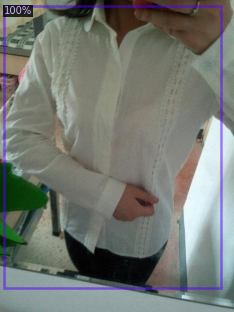

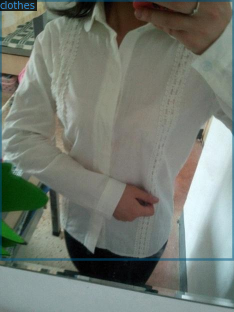

{'file_name': 'drive/My Drive/Colab Notebooks/Fashion/val/011991.jpg', 'image_id': 936, 'height': 1124, 'width': 750, 'annotations': [{'bbox': [188, 38, 610, 914], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'category_id': 0}, {'bbox': [156, 36, 515, 380], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'category_id': 0}]}
Instances(num_instances=1, image_height=1124, image_width=750, fields=[pred_boxes: Boxes(tensor([[168.8067,   7.8246, 493.0305, 371.2345]])), scores: tensor([0.9580]), pred_classes: tensor([0])])


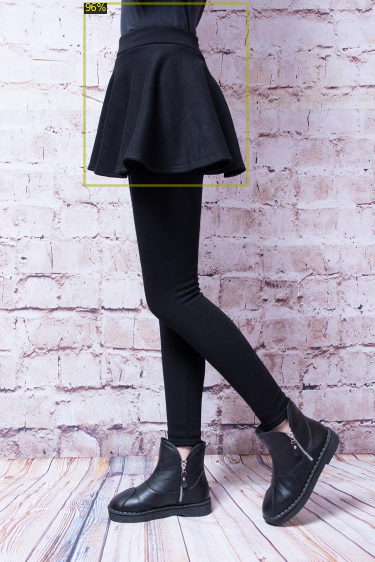

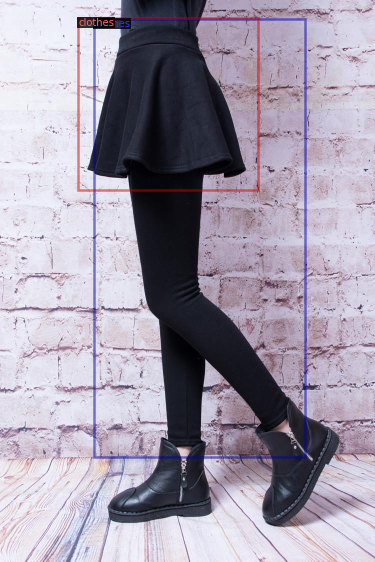

{'file_name': 'drive/My Drive/Colab Notebooks/Fashion/val/010516.jpg', 'image_id': 1579, 'height': 624, 'width': 468, 'annotations': [{'bbox': [0, 0, 466, 590], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'category_id': 0}]}
Instances(num_instances=1, image_height=624, image_width=468, fields=[pred_boxes: Boxes(tensor([[  0.0000,   0.0000, 461.4477, 591.7445]])), scores: tensor([0.9882]), pred_classes: tensor([0])])


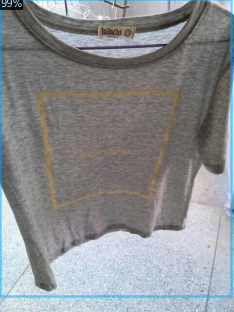

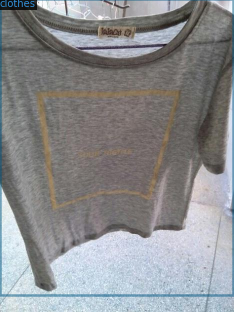

In [28]:
for d in random.sample(read_dictionary2('val2'), 3):
    print(d)
    im = cv2.imread(d["file_name"])
    outputs = predictor2(im)
    print(outputs["instances"].to("cpu"))
    outputs1 = outputs["instances"].to("cpu")
    outputs1.pred_classes = outputs1.pred_classes.tolist()
    v = Visualizer(im[:, :, ::-1],
                   metadata=fashion_metadata2, 
                   scale=0.5)
    out = v.draw_instance_predictions(outputs1)
    cv2_imshow(out.get_image()[:, :, ::-1])
    
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=fashion_metadata2, scale=0.5)
    out0 = visualizer.draw_dataset_dict(d)
    cv2_imshow(out0.get_image()[:, :, ::-1])

##### Evaluate performance using AP metric implemented in COCO API.

In [29]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("fashion_val2", cfg, False, output_dir="./drive/My Drive/Colab Notebooks/Fashion")
val_loader = build_detection_test_loader(cfg, "fashion_val2")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [07/03 12:55:28 d2.evaluation.coco_evaluation]: json_file was not found in MetaDataCatalog for 'fashion_val2'. Trying to convert it to COCO format ...
[07/03 12:55:28 d2.data.datasets.coco]: Converting annotations of dataset 'fashion_val2' to COCO format ...)
[07/03 12:55:28 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[07/03 12:55:29 d2.data.datasets.coco]: Conversion finished, #images: 2001, #annotations: 3297
[07/03 12:55:29 d2.data.datasets.coco]: Caching COCO format annotations at './drive/My Drive/Colab Notebooks/Fashion/fashion_val2_coco_format.json' ...
[07/03 12:55:29 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|  clothes   | 3297         |
|            |              |
[07/03 12:55:29 d2.data.common]: Serializing 2001 elements to byte tensors and concatenating them all ...
[07/03 12:55:29 d2.data.common]: Serialized dataset takes 0.49 MiB
[07/03 12:55:29 d2.evaluatio

OrderedDict([('bbox',
              {'AP': 22.66377661954931,
               'AP50': 57.12035138692975,
               'AP75': 10.986347364138771,
               'APl': 23.115353267801027,
               'APm': 2.130160471296283,
               'APs': nan})])

## Stage 6.2: Inference & evaluation using the trained model - Full set

In [34]:
# Change to eval mode, treshold = 0.9
cfg.MODEL.WEIGHTS = os.path.join('/content/drive/My Drive/Colab Notebooks/Fashion/output/', "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.1  # set the testing threshold for this model
cfg.DATASETS.TEST = ("fashion_val", )
predictor = DefaultPredictor(cfg)

Randomly select several samples to visualize the prediction results.

{'file_name': 'drive/My Drive/Colab Notebooks/Fashion/val/011997.jpg', 'image_id': 996, 'height': 574, 'width': 800, 'annotations': [{'bbox': [381, 92, 553, 528], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'category_id': 8}, {'bbox': [379, 90, 571, 221], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'category_id': 9}, {'bbox': [373, 0, 569, 150], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'category_id': 2}]}
Instances(num_instances=3, image_height=574, image_width=800, fields=[pred_boxes: Boxes(tensor([[388.9964,   0.0000, 501.9180, 151.1139],
        [392.4399, 174.1302, 499.2767, 527.8887],
        [416.8456,   7.8011, 560.1785, 221.2675]])), scores: tensor([0.1372, 0.1199, 0.1008]), pred_classes: tensor([2, 2, 7])])


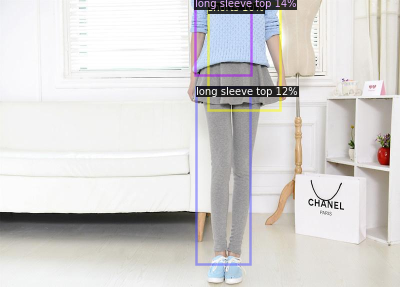

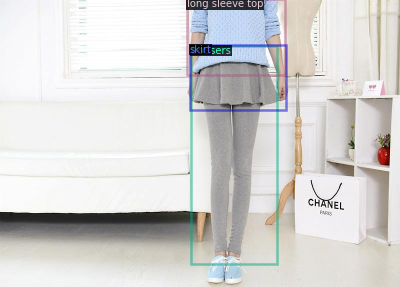

{'file_name': 'drive/My Drive/Colab Notebooks/Fashion/val/011014.jpg', 'image_id': 15, 'height': 1056, 'width': 880, 'annotations': [{'bbox': [0, 545, 574, 1055], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'category_id': 8}, {'bbox': [9, 0, 873, 915], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'category_id': 2}]}
Instances(num_instances=2, image_height=1056, image_width=880, fields=[pred_boxes: Boxes(tensor([[   0.0000,  102.2450,  660.0227, 1056.0000],
        [   0.0000,  663.2526,  466.7422, 1056.0000]])), scores: tensor([0.1165, 0.1038]), pred_classes: tensor([2, 2])])


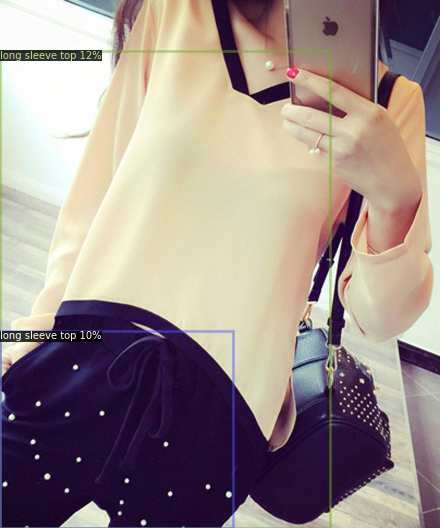

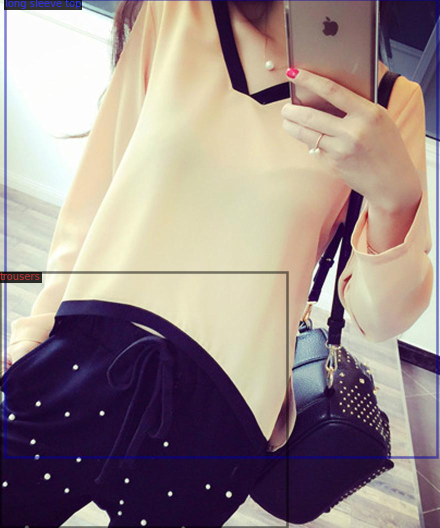

{'file_name': 'drive/My Drive/Colab Notebooks/Fashion/val/010738.jpg', 'image_id': 1683, 'height': 899, 'width': 640, 'annotations': [{'bbox': [305, 461, 522, 824], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'category_id': 12}, {'bbox': [313, 452, 525, 653], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'category_id': 1}]}
Instances(num_instances=4, image_height=899, image_width=640, fields=[pred_boxes: Boxes(tensor([[325.6028, 458.8371, 498.3874, 634.6010],
        [364.4098, 316.7859, 513.0539, 899.0000],
        [359.4895, 502.6630, 548.2448, 827.2875],
        [306.2603, 458.2242, 518.9441, 817.0753]])), scores: tensor([0.1102, 0.1096, 0.1059, 0.1038]), pred_classes: tensor([2, 7, 7, 2])])


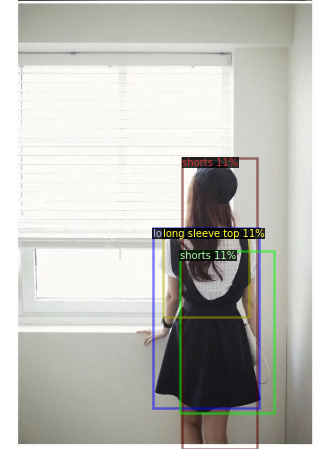

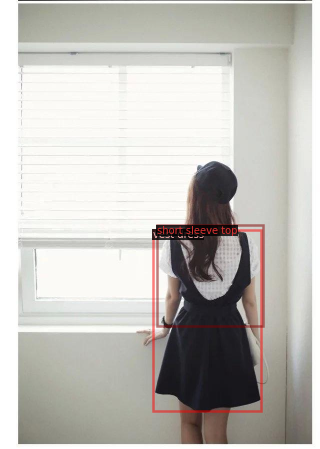

In [35]:
for d in random.sample(read_dictionary('val'), 3):
    print(d)
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    print(outputs["instances"].to("cpu"))
    outputs1 = outputs["instances"].to("cpu")
    outputs1.pred_classes = outputs1.pred_classes.tolist()
    v = Visualizer(im[:, :, ::-1],
                   metadata=fashion_metadata, 
                   scale=0.5)
    out = v.draw_instance_predictions(outputs1)
    cv2_imshow(out.get_image()[:, :, ::-1])
    
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=fashion_metadata, scale=0.5)
    out0 = visualizer.draw_dataset_dict(d)
    cv2_imshow(out0.get_image()[:, :, ::-1])

##### Evaluate performance using AP metric implemented in COCO API.

In [36]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("fashion_val", cfg, False, output_dir="./drive/My Drive/Colab Notebooks/Fashion")
val_loader = build_detection_test_loader(cfg, "fashion_val")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [07/03 13:08:48 d2.evaluation.coco_evaluation]: json_file was not found in MetaDataCatalog for 'fashion_val'. Trying to convert it to COCO format ...
[07/03 13:08:48 d2.data.datasets.coco]: Converting annotations of dataset 'fashion_val' to COCO format ...)
[07/03 13:08:48 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[07/03 13:08:49 d2.data.datasets.coco]: Conversion finished, #images: 2001, #annotations: 3297
[07/03 13:08:49 d2.data.datasets.coco]: Caching COCO format annotations at './drive/My Drive/Colab Notebooks/Fashion/fashion_val_coco_format.json' ...
[07/03 13:08:49 d2.data.build]: Distribution of instances among all 13 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
|  sling dress  | 62           | short sleev.. | 761          | long sleeve.. | 376          |
| short sleev.. | 1            | long 

OrderedDict([('bbox',
              {'AP': 1.7021253840568855,
               'AP-0': 1.4200221421647987,
               'AP-1': 6.2486500350376515,
               'AP-10': 0.6104106644157727,
               'AP-11': 0.9246018049317125,
               'AP-12': 2.1568412757641915,
               'AP-2': 3.1712162014483347,
               'AP-3': 0.013089005235602096,
               'AP-4': 1.7068430381398962,
               'AP-5': 0.6817403431717579,
               'AP-6': 0.11191509376842518,
               'AP-7': 1.6057911245847938,
               'AP-8': 2.738605740477737,
               'AP-9': 0.7379035235988392,
               'AP50': 5.27575098734044,
               'AP75': 0.4792805469209986,
               'APl': 1.7365200110491554,
               'APm': 0.5568490446400706,
               'APs': nan})])

# Random photo prediction

Instances(num_instances=10, image_height=731, image_width=1400, fields=[pred_boxes: Boxes(tensor([[1147.9139,  198.9794, 1341.3030,  587.8065],
        [ 179.2691,  136.2708,  409.9173,  609.5854],
        [ 409.2633,  243.7361,  575.9765,  566.4658],
        [1020.6433,  104.8372, 1206.7585,  630.8781],
        [ 415.1643,  157.1600,  584.6680,  353.6645],
        [  70.1066,  145.4860,  218.7222,  366.1799],
        [ 577.5618,   77.8967,  949.9183,  705.2059],
        [ 921.3607,  143.5869, 1036.3109,  520.0652],
        [ 799.2423,  116.7384,  945.8054,  366.3712],
        [1150.2126,  159.9196, 1344.5704,  321.3268]])), scores: tensor([0.9776, 0.9692, 0.9668, 0.9631, 0.9482, 0.9462, 0.9429, 0.9390, 0.9318,
        0.9163]), pred_classes: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])])


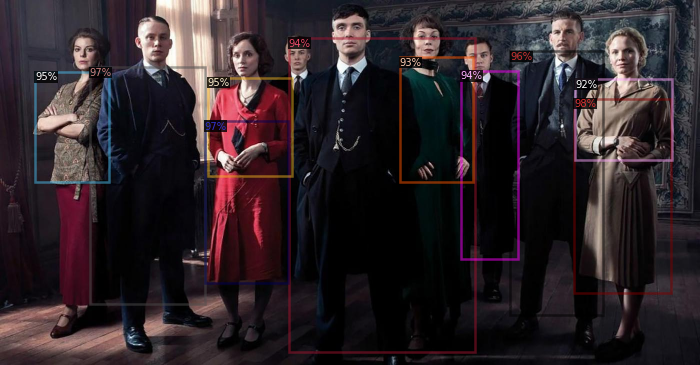

In [38]:
# One class
im = cv2.imread('/content/drive/My Drive/Colab Notebooks/Fashion/peaky blinders.jpg')
outputs = predictor2(im)
print(outputs["instances"].to("cpu"))
outputs1 = outputs["instances"].to("cpu")
outputs1.pred_classes = outputs1.pred_classes.tolist()
v = Visualizer(im[:, :, ::-1],
  metadata=fashion_metadata2, 
  scale=0.5)
out = v.draw_instance_predictions(outputs1)
cv2_imshow(out.get_image()[:, :, ::-1])

Instances(num_instances=3, image_height=731, image_width=1400, fields=[pred_boxes: Boxes(tensor([[ 583.6117,  150.0598,  824.4095,  672.4150],
        [1203.2385,  109.1707, 1320.0858,  667.1143],
        [ 991.3255,  162.4702, 1184.3167,  666.4086]])), scores: tensor([0.1242, 0.1052, 0.1042]), pred_classes: tensor([2, 7, 2])])


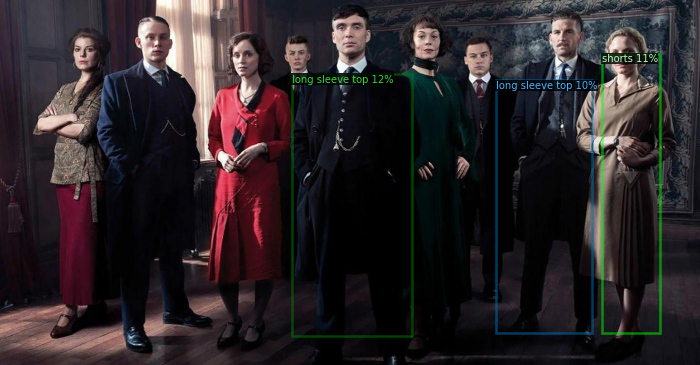

In [39]:
# Full set
im = cv2.imread('/content/drive/My Drive/Colab Notebooks/Fashion/peaky blinders.jpg')
outputs = predictor(im)
print(outputs["instances"].to("cpu"))
outputs1 = outputs["instances"].to("cpu")
outputs1.pred_classes = outputs1.pred_classes.tolist()
v = Visualizer(im[:, :, ::-1],
  metadata=fashion_metadata, 
  scale=0.5)
out = v.draw_instance_predictions(outputs1)
cv2_imshow(out.get_image()[:, :, ::-1])

## Stage 7: Application.

1. One can use this kind of a detector for analysing photoes in social network to see what type of clothes person likes to wear. This information can be used for more efficient target advertising.
2. Also we can use detection to analyse videos from cameras near the usual shop to understand which clothes prefer people walking nearby. So we can use this knowledge to make some marketing (dress dummies, for instance) to higher sells.
3. Checking unusual clothes (big sizes, warm for hot weather) to take attention of security service. Unusual clothes can be used by thieves to steal some stuff under it.